# Initial Reviewing of Datasets

Dataset: Feedback Prize - English Language Learning - Evaluating language knowledge of ELL students from grades 8-12 

Dataset: Feedback Prize - English Language Learning - Evaluating language knowledge of ELL students from grades 8-12 

Source: https://www.kaggle.com/competitions/feedback-prize-english-language-learning/overview/evaluation

API Call: kaggle competitions download -c feedback-prize-english-language-learning

Goal Description: 
- Each measure represents a component of proficiency in essay writing, with greater scores corresponding to greater proficiency in that measure. The scores range from 1.0 to 5.0 in increments of 0.5. Your task is to predict the score of each of the six measures for the essays given in the test set.

Additional competition and datset: Feedback Prize - Predicting Effective Arguments https://www.kaggle.com/competitions/feedback-prize-effectiveness/data

I think we can do a random forest that can classify each outcome since they are categorical. We can engineer the parameters that are optimized for the scores. I think we can do a descending model, starting from a 5 then working down to a 1 if it fails the cut off. Or for smiplicity we can just look at an overall score by summing the outcomes. 

Natural language processing libraries and bag of words. 

In [1]:
# Download dataset
# Add kaggle.json for own API key
# update kaggle_url.txt with kaggle api call

# !rm -fr ./data &> /dev/null
# !rm -f ./Automating_kaggle_dataset/kaggle_url.sh &> /dev/null
# !echo "kaggle competitions download -c feedback-prize-english-language-learning" >> ./Automating_kaggle_dataset/kaggle_url.sh
# !sh Automating_kaggle_dataset/download_kaggle_dataset.sh < ./Automating_kaggle_dataset/kaggle_url.sh &> /dev/null
# !echo "Data downloaded from kaggle"

In [2]:
# standard
import pandas as pd
import numpy as np
import random
import os

# tf and keras
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.layers import Dropout
import tensorflow_text as tf_text
import tensorflow_datasets as tfds

# shap
import shap

# plots and images
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image

# others
import re
from sklearn.decomposition import PCA
from wordcloud import WordCloud
from collections import Counter
import warnings
warnings.filterwarnings("ignore")

#silence TF
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 


random.seed(2)
%matplotlib inline

# FILL IN CODE HERE #
DATA_PATH = '' # replace with your path

2022-10-24 07:14:08.852016: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-24 07:14:09.072779: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-24 07:14:09.072814: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-10-24 07:14:09.127830: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-24 07:14:11.466600: W tensorflow/stream_executor/pla

## Functions

In [46]:
def preprocessor(text):
    text = re.sub('<[^>]*>', '', text)
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)',
                           text)
    text = (re.sub('[\W]+', ' ', text.lower()) +
            ' '.join(emoticons).replace('-', ''))
    return text

# define function for token encoder
def encode(text_tensor, label):
    text = text_tensor.numpy()[0]
    encoded_text = encoder.encode(text)
    return encoded_text, label

#  wrap the encode function to a TF Operator
def encode_map_fn(text, label):
    return tf.py_function(encode, inp=[text, label], 
                          Tout=(tf.int64, tf.int64)) # need to use float64 when using the actual labels

In [4]:
# # Packages
# import pandas as pd
# import numpy  as np

# # Graphing: 
# import seaborn as sns
# import matplotlib.pyplot as plt

# # ML Libaries
# import tensorflow as tf
# import sklearn
# below is taken from deep note example: https://deepnote.com/@joshzwiebel/Using-the-transformers-library-e34c35b3-eeb8-4706-962c-57341bd0dafe
# import tensorflow_hub as hub
# from transformers.modeling_tf_openai import TFOpenAIGPTLMHeadModel #this is the GPT transformer with additional layers added for easy language modeling
# from transformers.tokenization_openai import OpenAIGPTTokenizer
# import simpletransformers

# from sklearn.feature_extraction.text import CountVectorizer

In [5]:
#EDA
train = pd.read_csv("./data/train.csv")
test = pd.read_csv("./data/test.csv")

## EDA

In [6]:
print(train.head())
print("\n")
print(train.shape)
print("\n")
print(train.columns)

        text_id                                          full_text  cohesion  \
0  0016926B079C  I think that students would benefit from learn...       3.5   
1  0022683E9EA5  When a problem is a change you have to let it ...       2.5   
2  00299B378633  Dear, Principal\n\nIf u change the school poli...       3.0   
3  003885A45F42  The best time in life is when you become yours...       4.5   
4  0049B1DF5CCC  Small act of kindness can impact in other peop...       2.5   

   syntax  vocabulary  phraseology  grammar  conventions  
0     3.5         3.0          3.0      4.0          3.0  
1     2.5         3.0          2.0      2.0          2.5  
2     3.5         3.0          3.0      3.0          2.5  
3     4.5         4.5          4.5      4.0          5.0  
4     3.0         3.0          3.0      2.5          2.5  


(3911, 8)


Index(['text_id', 'full_text', 'cohesion', 'syntax', 'vocabulary',
       'phraseology', 'grammar', 'conventions'],
      dtype='object')


In [7]:
train.describe()

,cohesion,syntax,vocabulary,phraseology,grammar,conventions
count,3911.000000,3911.000000,3911.000000,3911.000000,3911.000000,3911.000000
mean,3.127077,3.028254,3.235745,3.116850,3.032856,3.081053
std,0.662542,0.644399,0.583148,0.655997,0.699841,0.671450
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.500000,2.500000,3.000000,2.500000,2.500000,2.500000
50%,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,3.500000,3.500000,3.500000,3.500000,3.500000,3.500000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [8]:
DeepnoteChart(train, """{"mark":{"type":"bar","tooltip":true},"$schema":"https://vega.github.io/schema/vega-lite/v4.json","encoding":{"x":{"sort":null,"type":"quantitative","field":"COUNT(*)","scale":{"type":"linear","zero":false},"aggregate":"count"},"y":{"sort":null,"type":"quantitative","field":"cohesion","scale":{"type":"linear","zero":true}},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}},"height":440,"width":"container","config":{"background":"#ffffff","title":{"anchor":"start","color":"#000000","font":"Inter, sans-serif","fontSize":22,"fontWeight":"normal"},"area":{"fill":"#51C0E9"},"line":{"stroke":"#51C0E9","strokeWidth":2},"rect":{"fill":"#51C0E9"},"axis":{"labelFont":"Inter, sans-serif","labelFontSize":12,"labelFontWeight":"normal","titleFont":"Inter, sans-serif","titleFontSize":12,"titleFontWeight":"bold","labelOverlap":"greedy"},"legend":{"labelFont":"Inter, sans-serif","labelFontSize":12,"titleFont":"Inter, sans-serif","titleFontSize":12,"titleFontWeight":"bold"}}}""")

In [9]:
train.corr()

,cohesion,syntax,vocabulary,phraseology,grammar,conventions
cohesion,1.000000,0.695459,0.666151,0.690058,0.638689,0.666151
syntax,0.695459,1.000000,0.680562,0.725467,0.709525,0.700025
vocabulary,0.666151,0.680562,1.000000,0.735261,0.654852,0.664292
phraseology,0.690058,0.725467,0.735261,1.000000,0.719746,0.666842
grammar,0.638689,0.709525,0.654852,0.719746,1.000000,0.673301
conventions,0.666151,0.700025,0.664292,0.666842,0.673301,1.000000


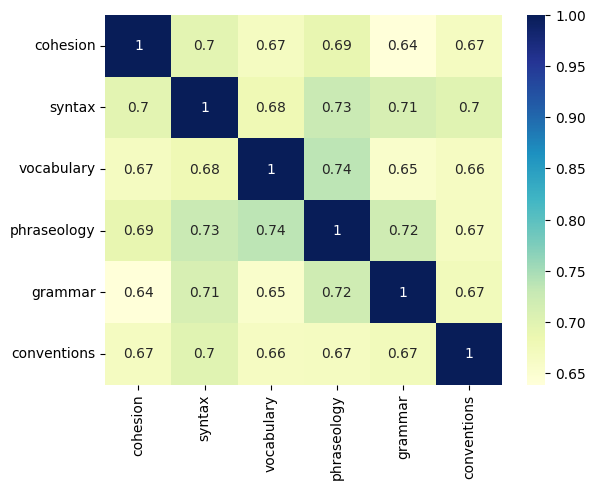

In [10]:
dataplot = sns.heatmap(train.corr(), cmap="YlGnBu", annot=True)

Appears that phraseology and syntax and vocbulary are all related. I would think these are colinear with each other since they cover a similar type of characteristic. But there are no clear categories that stick out.

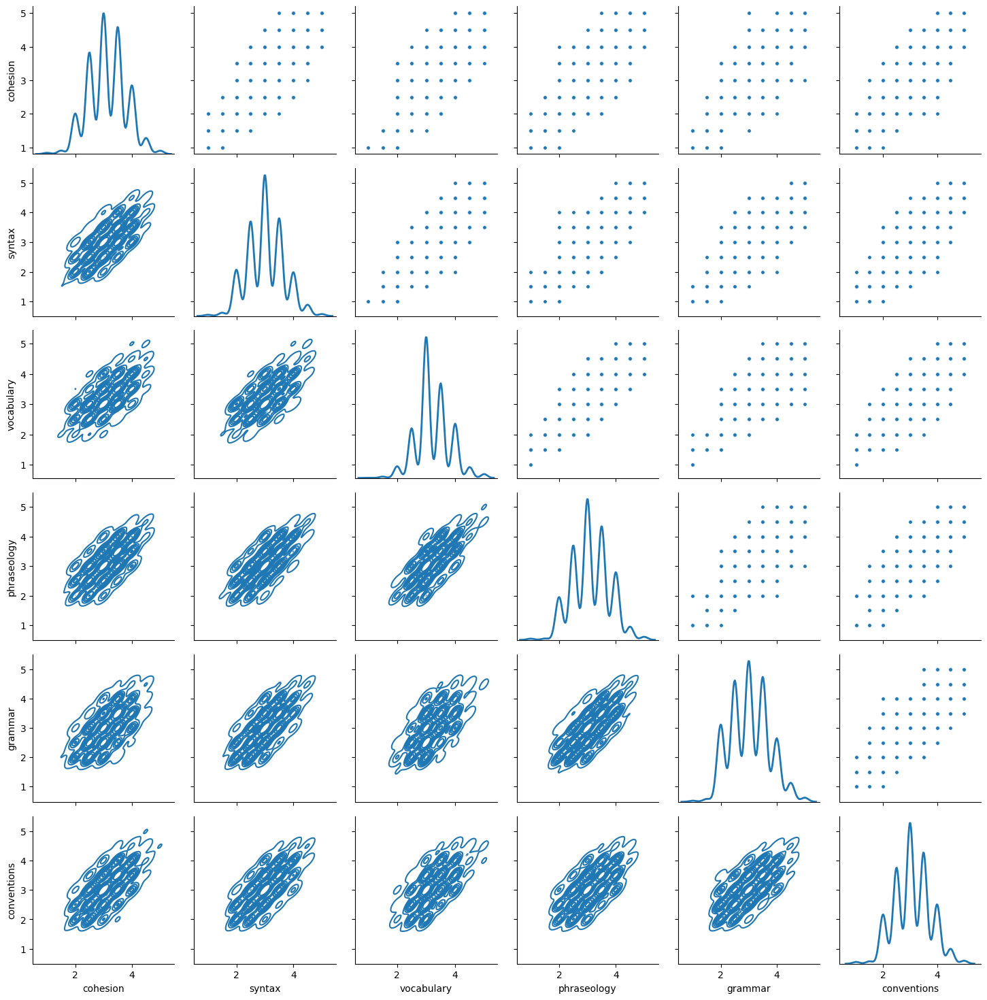

In [11]:
g = sns.PairGrid(train, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)

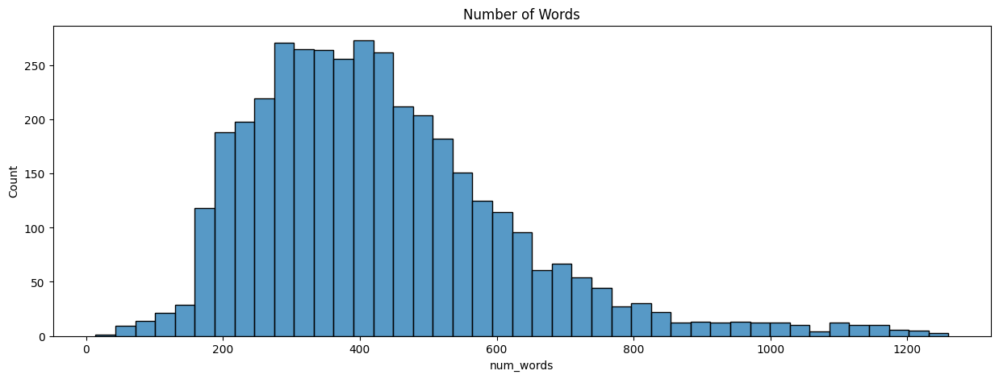

In [12]:
#compute the number of words in each essay
train['num_words'] = train['full_text'].apply(lambda x: len(x.split()))

#plot the distribution of the number of words
fig = plt.figure(figsize=(15, 5))
sns.histplot(data=train, x="num_words")
plt.title("Number of Words")
plt.show()

In [15]:
def distr_rating(interest_var, rating, col_wrap = 3):
    g = sns.FacetGrid(train, col= rating , col_wrap= col_wrap, height=4)
    g.map(plt.hist, interest_var, bins=50)
    plt.show()


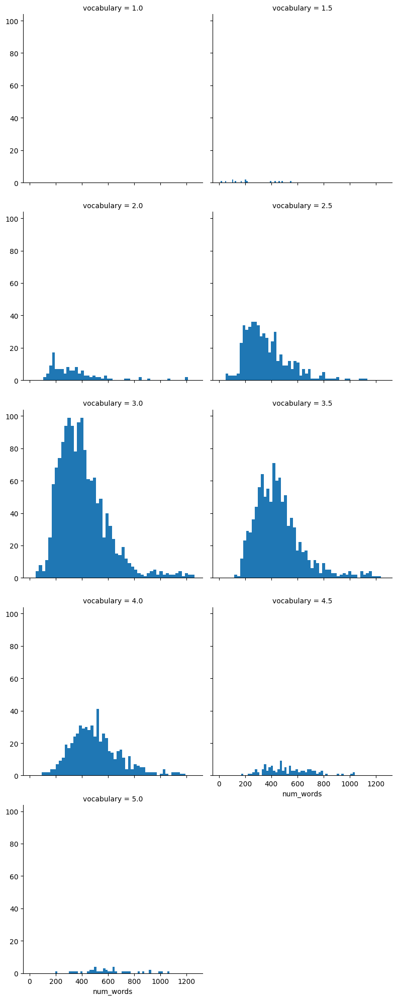

In [16]:
g = sns.FacetGrid(train, col='vocabulary', col_wrap=2, height=4)
g.map(plt.hist, 'num_words', bins=50)
plt.show()

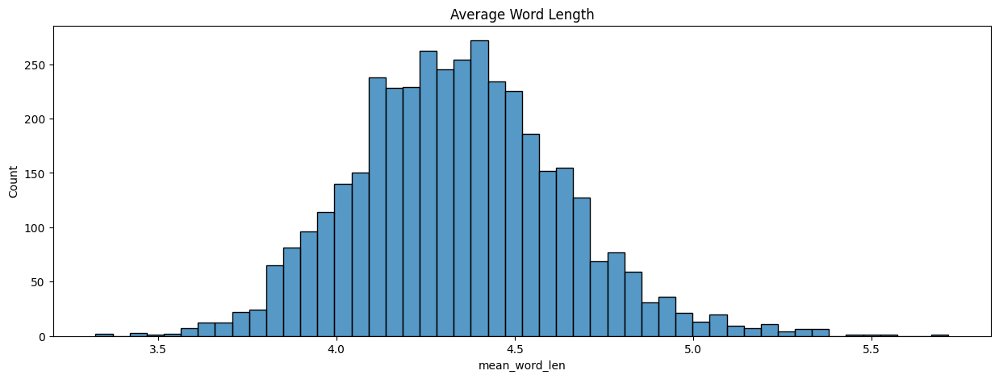

In [17]:
#compute the average length of words for each essay
train['mean_word_len'] = train['full_text'].str.split().apply(lambda x : np.mean([len(i) for i in x]))

#plot the distribution of the average length of words
fig = plt.figure(figsize=(15, 5))
sns.histplot(data=train, x="mean_word_len")
plt.title("Average Word Length")
plt.show()


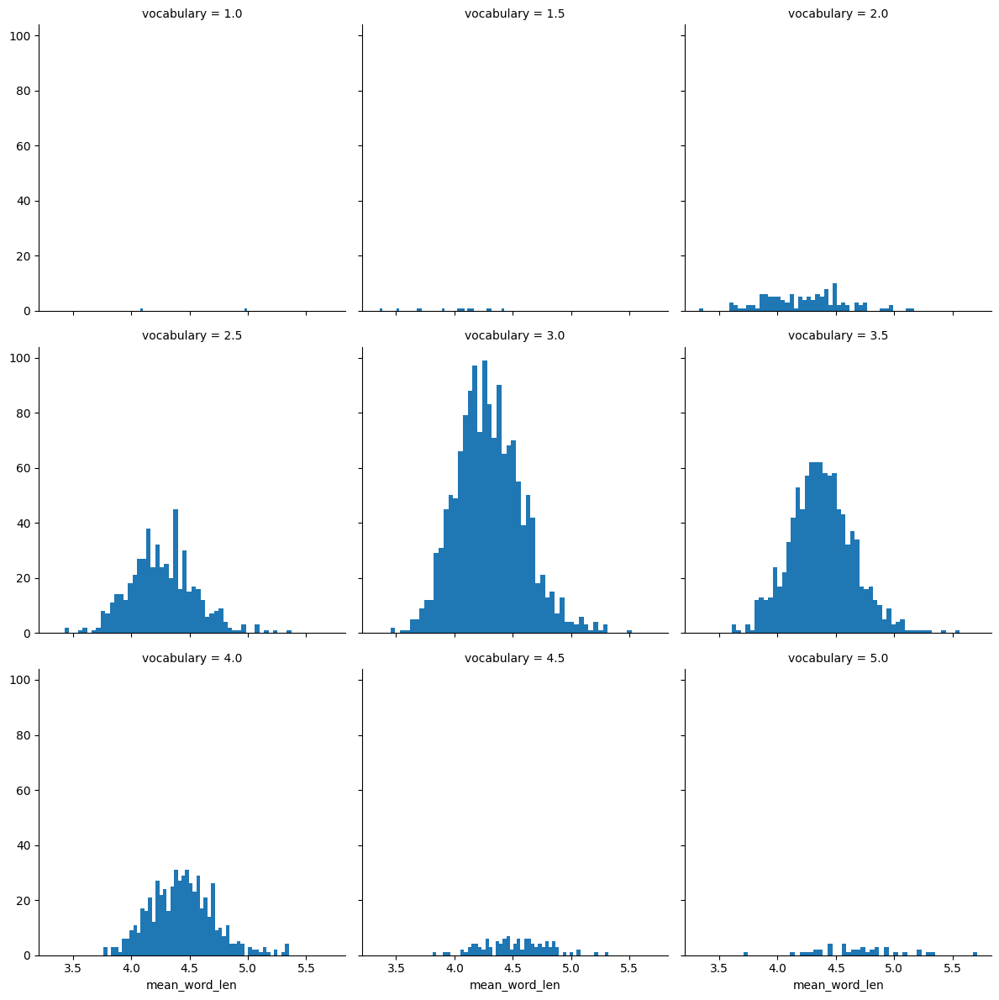

In [18]:
distr_rating(col_wrap = 3, interest_var='mean_word_len', rating='vocabulary')

Data across all output categories looks about normall distributed. May even be able to bin the results as scores ranging over dataset. 

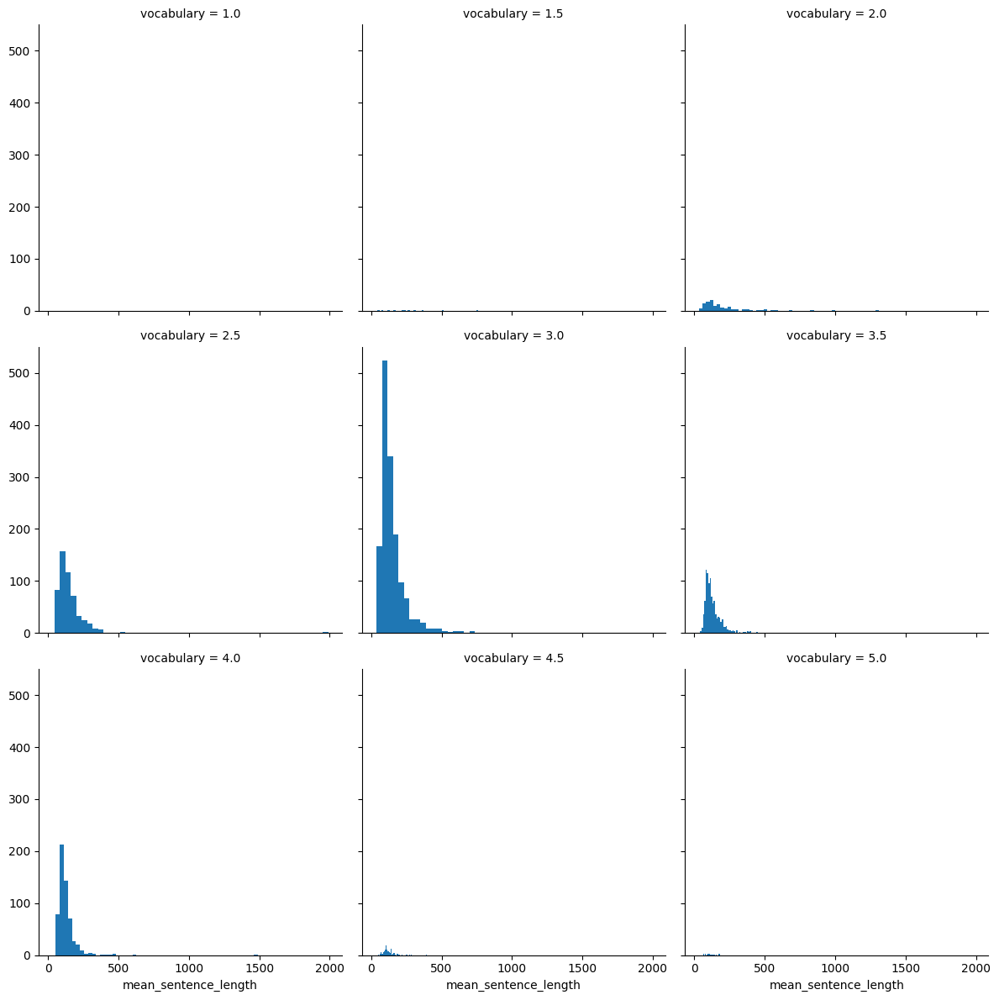

In [19]:
# lengths of sentences
train['mean_sentence_length'] = train['full_text'].str.split('\.').apply(lambda x : np.mean([len(i) for i in x]))
distr_rating(col_wrap = 3, interest_var='mean_sentence_length', rating='vocabulary')


In [20]:
# outputs are discrete rather than continuous
dtypes = {c: 'category' for c in ('cohesion', 'syntax', 'vocabulary', 'phraseology', 'grammar', 'conventions')}
train = train.astype(dtypes)

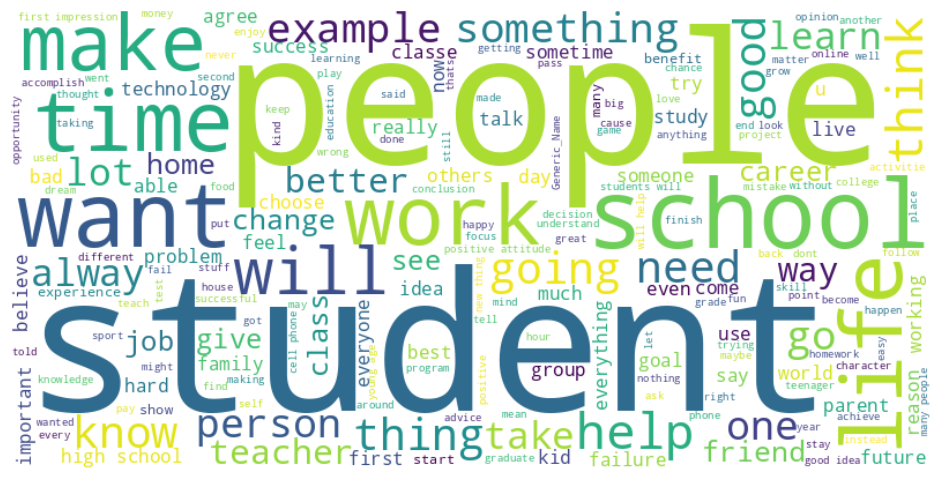

In [21]:
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(''.join(train['full_text']))
plt.figure(figsize=(20, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [22]:
# train_vectors = count_vectorizer.fit_transform(train['full_text'])

# Just using .transform() ensures tokens in train vectors are only ones mapped to test vectors, i.e. train and test vectors use same set of tokens

# test_vectors = count_vectorizer.transform(test['full_text'])

Efficiency Score: 
def efficiency_score():

## Evaluation: 
MCRMSE: mean columnwise root mean square error.
$N_t$ is the number of scored ground truth target columns and y and $y^{hat}$ are the actual and predicted values. 

In [23]:
# F1 Score - harmonic mean of the precision and recall best value at 1, worst at 0. 
# F1 = 2 * (precision * recall) / (precesion + recall)
# good for unbalanced dataset. How do you tell if data is unbalanced? 

# Sparse Categorical Accuracy - calculates how often predictions match integer labels, it checks to see if hte maximal true value is equal to the index of the maximal predicted value


In [24]:
# Ridge regression - Look at other classifiers
# clf = sklearn.linear_model.RidgeClassifier()

In [25]:
# Model Building - predict vocabulary. 

# Siimilar meanings - Universal Sentence Encoder (USE) for word embeddings

# train test split
# X_train, X_test, y_train, y_test = train_test_split(train.toarray(), y, test_size=0.3, random_state=0)
# model

# training

# testing

# validation

## Remove Unwanted characters

In [26]:
train['full_text'] = train['full_text'].apply(preprocessor)

In [27]:
train.columns

Index(['text_id', 'full_text', 'cohesion', 'syntax', 'vocabulary',
       'phraseology', 'grammar', 'conventions', 'num_words', 'mean_word_len',
       'mean_sentence_length'],
      dtype='object')

In [28]:
ratings = [i/2 for i in range(2, 11)]

In [29]:
# outputs are discrete rather than continuous
dtypes = {c: 'float64' for c in ('cohesion', 'syntax', 'vocabulary', 'phraseology', 'grammar', 'conventions')}
train = train.astype(dtypes)

In [30]:
# Recode outcomes to binary classifiers to make the problem simpler for now: 
# train_recoded = train.copy()
for i in ['cohesion', 'syntax', 'vocabulary', 'phraseology', 'grammar', 'conventions']: 
    train[i] = np.where(train[i] <= 3, 0, 1)

array([[<AxesSubplot:title={'center':'cohesion'}>,
        <AxesSubplot:title={'center':'syntax'}>,
        <AxesSubplot:title={'center':'vocabulary'}>],
       [<AxesSubplot:title={'center':'phraseology'}>,
        <AxesSubplot:title={'center':'grammar'}>,
        <AxesSubplot:title={'center':'conventions'}>],
       [<AxesSubplot:title={'center':'num_words'}>,
        <AxesSubplot:title={'center':'mean_word_len'}>,
        <AxesSubplot:title={'center':'mean_sentence_length'}>]],
      dtype=object)

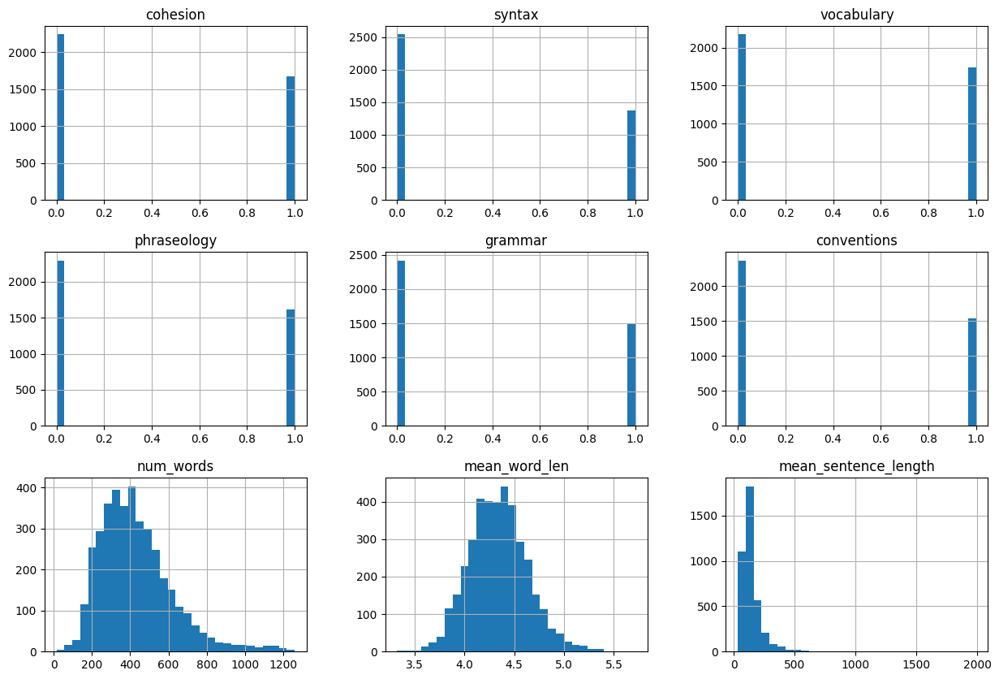

In [31]:
train.hist(bins=30, figsize=(15, 10))

Might need to balance the dataset since there are an uneven number in each category

In [32]:
df_vocab = train[['full_text', 'vocabulary']]
df_vocab.head()

,full_text,vocabulary
0,i think that students would benefit from learn...,0
1,when a problem is a change you have to let it ...,0
2,dear principal if u change the school policy o...,0
3,the best time in life is when you become yours...,1
4,small act of kindness can impact in other peop...,0


In [33]:
target_vocab = df_vocab.pop('vocabulary')

In [34]:
target_vocab

0       0
1       0
2       0
3       1
4       0
       ..
3906    0
3907    1
3908    0
3909    1
3910    1
Name: vocabulary, Length: 3911, dtype: int64

In [35]:
data_vocab_tf = tf.data.Dataset.from_tensor_slices(
    (df_vocab[['full_text']].values, target_vocab.values)
)

2022-10-24 07:16:52.810086: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-10-24 07:16:52.810147: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-24 07:16:52.810174: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (p-2f4f67ec-8ee7-457f-9dd1-c26bc82a923b): /proc/driver/nvidia/version does not exist
2022-10-24 07:16:52.811341: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [36]:
# inspection of the first 5 examples
for example in data_vocab_tf.take(5):
    # print review (first 40 characters) and sentiment (label)
    tf.print(example[0].numpy()[0][:40], example[1])

b'i think that students would benefit from' 0
b'when a problem is a change you have to l' 0
b'dear principal if u change the school po' 0
b'the best time in life is when you become' 1
b'small act of kindness can impact in othe' 0


In [49]:
tf.random.set_seed(26)

splits = [0.6, 0.2, 0.2]

df_shape = df_vocab.shape[0]

data_vocab_tf = data_vocab_tf.shuffle(
    df_shape, reshuffle_each_iteration=False
)

# Look at doing a train test split with tensor flow
data_vocab_tf_test = data_vocab_tf.take(int(df_shape * splits[2]))
data_vocab_tf_train_valid = data_vocab_tf.skip(int(df_shape * splits[2]))
data_vocab_tf_train = data_vocab_tf_train_valid.take(int(df_shape * splits[0]))
data_vocab_tf_valid = data_vocab_tf_train_valid.skip(int(df_shape * splits[0]))

In [50]:
data_vocab_tf_test

<TakeDataset element_spec=(TensorSpec(shape=(1,), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

What is a take class? 

## ID unique words (tokens) in training dataset

In [51]:
try: 
    tokenizer = tf_text.Tokenizer()
except: 
    tokenizer = tf_text.Tokenizer()

token_counts = Counter()

In [52]:
# try and except the TF tokenizer
try:
    tokenizer = tfds.features.text.Tokenizer()
except AttributeError:
    tokenizer = tfds.deprecated.text.Tokenizer()

# create an instance of the Counter class
token_counts = Counter()

for example in data_vocab_tf_train:
    tokens = tokenizer.tokenize(example[0].numpy()[0])
    token_counts.update(tokens)
    
print('Size of training vocabulary:', len(token_counts))

Size of training vocabulary: 16204


In [53]:
# to see vocabulary
display(tokens)

['one',
 'topic',
 'that',
 'is',
 'frequently',
 'debated',
 'is',
 'about',
 'the',
 'benefit',
 'people',
 'receive',
 'to',
 'take',
 'classes',
 'online',
 'some',
 'people',
 'think',
 'that',
 'if',
 'someone',
 'want',
 'to',
 'keep',
 'study',
 'they',
 'have',
 'to',
 'go',
 'a',
 'school',
 'to',
 'take',
 'that',
 'class',
 'or',
 'the',
 'classes',
 'that',
 'they',
 'need',
 'they',
 'feel',
 'that',
 'some',
 'people',
 'do',
 'not',
 'deserved',
 'the',
 'chance',
 'to',
 'take',
 'classes',
 'from',
 'their',
 'home',
 'in',
 'my',
 'opinion',
 'i',
 'think',
 'that',
 'taking',
 'classes',
 'online',
 'is',
 'a',
 'good',
 'opportunity',
 'for',
 'many',
 'people',
 'because',
 'people',
 'can',
 'work',
 'and',
 'study',
 'at',
 'the',
 'same',
 'time',
 'those',
 'classes',
 'can',
 'be',
 'more',
 'cheap',
 'and',
 'not',
 'everybody',
 'have',
 'the',
 'opportunity',
 'to',
 'attend',
 'a',
 'college',
 'or',
 'an',
 'university',
 'first',
 'taking',
 'classes',


## Encoding sequences of words into sequences of integers

In [54]:
# create an instance of the TF encoder class
try:
    encoder = tfds.features.text.TokenTextEncoder(token_counts) # token_counts contains our training vocabulary
except AttributeError:
    encoder = tfds.deprecated.text.TokenTextEncoder(token_counts)


In [55]:
# try an example first (first 12 characters from the second review in training data)
example_str = 'My son took generic for about 6 months. His dr actually prescribed'
encoder.encode(example_str) # the encode method transforms the text into integers

[16205, 1748, 1763, 752, 66, 58, 1369, 1733, 16205, 8693, 675, 16205]

In [56]:
data_vocab_tf_train = data_vocab_tf_train.map(encode_map_fn)
data_vocab_tf_train_valid = data_vocab_tf_train_valid.map(encode_map_fn)
data_vocab_tf_test = data_vocab_tf_test.map(encode_map_fn)

In [57]:
# print first two examples in training data
for example in data_vocab_tf_train.take(2):
    print ('----------------------------')
    print('Sequence length:', example[0].shape)
    print('Integer sequence:\n', example[0].numpy())

----------------------------
Sequence length: (292,)
Integer sequence:
 [  1   2   3   4   5   6   7   8   3   9  10   2   3  11  10  12  13  14
  15  16  13  17  18   8  19  20   2  11  10  21  12   5  22  23  24   2
   3   9  25  26  27  28   2  29  30  19  31  32  33  34  35   2  14  36
  10  32  37  38   2  36   8   2   3  39  40   2  41  32   2   3  42  43
  44  45  46  47  48  49  40  13  50  51  52  53   8  43  54  20  55  46
  56  57  58  53  13  14  59  19  60  61  18   8  13  14  62  63  32  13
  14  64  61  18  65  66  67   1  13  68  69  32  70  26  71  13  64   5
  72  45  73   8  32  74  75  76  77  47   5  78  18  79  80  73  39  81
  10  59   8  14   9  82  12  83  13  84   5  85  73  86  13  14  87  12
  88  13  87  32  52  89  30  87  19  90   8  91  66  92  91  12  88  13
  93  30  87  19  94  95  96   9  97  47   5  98   8  38  75  99 100  28
 101  13  95  96  84  30 102  58 103 104   8 105  59 106 107 108  30 109
  58 110  12   8  38 111 112  13  12   8  14 113  13

Divide the dataset into mini-batches as input to the model

In [58]:
# data_tf_batched = tf.raw_ops.PaddedBatchDataset(
#     input_dataset = data_vocab_tf, batch_size=3,padded_shapes=([-1], []), padding_values = 5,
#     output_shapes=([-1], [])
# )

# for batch in data_tf_batched: 
#     print('Batch Dimensions', batch[0].shape)

# type(data_tf_batched)

In [59]:
data_vocab_tf_train

<MapDataset element_spec=(TensorSpec(shape=<unknown>, dtype=tf.int64, name=None), TensorSpec(shape=<unknown>, dtype=tf.int64, name=None))>

In [60]:
batch_size = 64

def batch_data(data, batch_size = 32):
    batch =  data.padded_batch(batch_size, padded_shapes = ([-1], [])) 
    print(type(batch))
    return batch

# # batcing of training, validation and test partitions

train_data = batch_data(data_vocab_tf_train)
valid_data = batch_data(data_vocab_tf_train_valid)
test_data = batch_data(data_vocab_tf_test)

# train_data = data_tf_train.padded_batch(
#     batch_size,
#     padded_shapes=([-1],[]))

# valid_data = data_tf_valid.padded_batch(
#     batch_size,
#     padded_shapes=([-1],[]))

# test_data = data_tf_test.padded_batch(
#     batch_size,
#     padded_shapes=([-1],[]))

<class 'tensorflow.python.data.ops.dataset_ops.PaddedBatchDataset'>
<class 'tensorflow.python.data.ops.dataset_ops.PaddedBatchDataset'>
<class 'tensorflow.python.data.ops.dataset_ops.PaddedBatchDataset'>


Average sequence length in training mini-batches: 976


Text(0.5, 0, 'Sequence length')

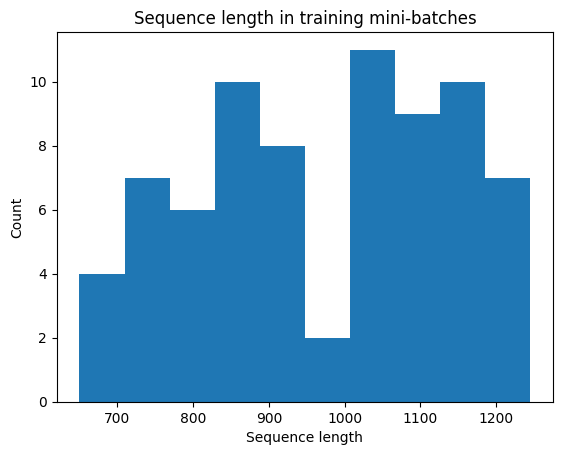

In [61]:
# histogram of sequence length in training mini-batches
seq_len_train = []
for batch in train_data:
    seq_len_train.append(batch[0].shape[1])
    
print('Average sequence length in training mini-batches:',
      int(sum(seq_len_train)/len(seq_len_train))
)

# histogram
plt.hist(seq_len_train)
plt.title('Sequence length in training mini-batches')
plt.ylabel('Count')
plt.xlabel('Sequence length')

Look at relationships between: (Harry has done some of this already) 
- Length v. Outcome
- Unique words v. Outcome

## Build Model

Look into Transfer Learning Approach to Build model
BERT model

In [62]:
len(token_counts)


16204

In [ ]:
vocab_train_size = len(token_counts) + 2
embedding_dim = 10 # 128 -> 128 -> 32
average_over_positions = True

# def build_nlp_model():
#   Clear session and remove randomness.
tf.keras.backend.clear_session()
tf.random.set_seed(0)

model = tf.keras.Sequential()

model.add(
    Embedding(
        input_dim = vocab_train_size, 
        output_dim = embedding_dim, 
        # input_length = 100, # Limiting length of sentence to 100 tokens
        name = 'embedding'
    )
),

# how many layers are needed? 
# one for each output to learn different features of the data? 
# do people use random forests in NLP? 
if average_over_positions: 
    model.add(GlobalAveragePooling1D()), 
else: 
    model.add(tf.keras.layers.Flatten())

model.add(Dense(128, activation = 'relu')), 

model.add(Dropout(0.5))

model.add(Dense(128, activation = 'sigmoid')) # output will be the 7 dimensions for the classifiers

model.add(Dropout(0.5))

model.add(Dense(32, activation = 'sigmoid')) # output will be the 7 dimensions for the classifiers

embeddings_untrained = model.get_layer('embedding').get_weights()[0]

# Print model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 10)          162060    
                                                                 
 global_average_pooling1d (G  (None, 10)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 6)                 66        
                                                                 
 dropout (Dropout)           (None, 6)                 0         
                                                                 
 dense_1 (Dense)             (None, 1)                 7         
                                                                 
Total params: 162,133
Trainable params: 162,133
Non-trainable params: 0
__________________________________________________

In [77]:
# Compile model
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=False), 
            optimizer= tf.keras.optimizers.Adam(),
            metrics=['accuracy'])

In [79]:
# Fit model
epochs = 10
history = model.fit(
    train_data, 
    validation_data = valid_data, 
    epochs=epochs
)

pd.DataFrame(history.history)

Epoch 1/10
74/74 [==============================] - 7s 89ms/step - loss: 0.6552 - accuracy: 0.6151 - val_loss: 0.6471 - val_accuracy: 0.6270
Epoch 2/10
74/74 [==============================] - 7s 89ms/step - loss: 0.6465 - accuracy: 0.6236 - val_loss: 0.6390 - val_accuracy: 0.6392
Epoch 3/10
74/74 [==============================] - 6s 87ms/step - loss: 0.6459 - accuracy: 0.6266 - val_loss: 0.6326 - val_accuracy: 0.6635
Epoch 4/10
74/74 [==============================] - 6s 87ms/step - loss: 0.6369 - accuracy: 0.6364 - val_loss: 0.6231 - val_accuracy: 0.6740
Epoch 5/10
74/74 [==============================] - 6s 87ms/step - loss: 0.6281 - accuracy: 0.6513 - val_loss: 0.6140 - val_accuracy: 0.6836
Epoch 6/10
74/74 [==============================] - 7s 89ms/step - loss: 0.6194 - accuracy: 0.6458 - val_loss: 0.6028 - val_accuracy: 0.7018
Epoch 7/10
74/74 [==============================] - 7s 90ms/step - loss: 0.6062 - accuracy: 0.6637 - val_loss: 0.5906 - val_accuracy: 0.7204
Epoch 8/10
74

,loss,accuracy,val_loss,val_accuracy
0,0.655203,0.615090,0.647135,0.627037
1,0.646511,0.623615,0.638968,0.639182
2,0.645924,0.626598,0.632605,0.663471
3,0.636938,0.636402,0.623102,0.674017
4,0.628093,0.651321,0.613993,0.683605
5,0.619447,0.645780,0.602772,0.701822
6,0.606246,0.663683,0.590618,0.720358
7,0.592697,0.679454,0.575648,0.725791
8,0.581736,0.695652,0.563806,0.737296
9,0.575219,0.693947,0.552728,0.751678


In [ ]:
# stopwords_english = stopwords.words('english')

In [103]:
#return a dictionary storing how many counts of the words in both negative and positive
def build_freqs(full_text, labels):
    freqs = {}
    for full_text, label in zip(full_text, list(labels)):
        for word in full_text.split():
            pair = (word, label)
            freqs[pair] = freqs.get(pair, 0) + 1
    return freqs

In [105]:
vocab_dict = build_freqs(train['full_text'], train['vocabulary'])

In [120]:
def extract_features(full_text, label):
    freq_dict = build_freqs(full_text, train[label])
    df = pd.DataFrame(columns=['bias','pos','neg'])
    pos_sums, neg_sums = [], []
    for text in full_text:
        pos, neg = 0, 0
        for word in text.split():
            if (word,1) in freq_dict:
                pos += freq_dict[(word, 1)]
            if (word,0) in freq_dict:
                neg += freq_dict[(word, 0)]
        pos_sums.append(pos)
        neg_sums.append(neg)
    df['pos'] = pos_sums
    df['neg'] = neg_sums
    df['bias'] = np.ones(len(df))
    df[label] = train[label]
    return df

In [121]:
extract_features(train['full_text'], 'vocabulary')

,bias,pos,neg,vocabulary
0,1.0,1927177,2057892,0
1,1.0,4655386,4983695,0
2,1.0,2259187,2422163,0
3,1.0,5822975,6305740,1
4,1.0,1693434,1829798,0
...,...,...,...,...
3906,1.0,962349,1000643,0
3907,1.0,3687605,3795600,1
3908,1.0,1876065,2006955,0
3909,1.0,3632992,3851334,1


In [87]:
experiments = {}

In [92]:
def build_nlp_model():
    vocab_train_size = len(token_counts) + 2 # I want to train on a smaller vocabulary and see if that makes a difference
    embedding_dim = 32
    average_over_positions = True
    epochs = 5

    training_log = {
        "vocab_train_size": vocab_train_size,
        "embedding_dim": embedding_dim,
        "average_over_positions": average_over_positions,
        "epochs": epochs
    }

    #   Clear session and remove randomness.
    tf.keras.backend.clear_session()
    tf.random.set_seed(0)

    model = tf.keras.Sequential()

    model.add(
        Embedding(
            input_dim = vocab_train_size, 
            output_dim = embedding_dim, 
            # input_length = 100, # Limiting length of sentence to 100 tokens
            name = 'embedding'
        )
    ),

    # how many layers are needed? 
    # one for each output to learn different features of the data? 
    # do people use random forests in NLP? 
    if average_over_positions: 
        model.add(GlobalAveragePooling1D()), 
    else: 
        model.add(tf.keras.layers.Flatten())

    model.add(Dense(12, activation = 'relu')), 

    model.add(Dropout(0.5)),

    model.add(Dense(12, activation = 'relu')),

    model.add(Dense(1, activation = 'sigmoid')) # output will be the 7 dimensions for the classifiers

    embeddings_untrained = model.get_layer('embedding').get_weights()[0]

    # Print model summary
    print(model.summary())

    # Compile model
    model.compile(
        loss='binary_crossentropy', 
        optimizer='adam',
        metrics=['accuracy'])

    # Fit model
    history = model.fit(
        train_data, 
        validation_data = valid_data, 
        epochs=epochs
    )
    
    # training_log.update(history.history)
    for idx, key in enumerate(history.history):
        training_log[key] = history.history[key][4]

    return training_log

In [93]:
# for quickly updating parameters later when fxing model building
experiment_params = {
    "training_set": training_set,
    "validation_set": validation_set,
    "vocab_train_size": vocab_train_size,
    "embedding_dim": embedding_dim,
    "average_over_positions": average_over_positions,
    "epochs": epochs,
    "optimizer": "adam", 
    "loss": "binary_crossentropy", 
}

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 32)          518592    
                                                                 
 global_average_pooling1d (G  (None, 32)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dense (Dense)               (None, 12)                396       
                                                                 
 dropout (Dropout)           (None, 12)                0         
                                                                 
 dense_1 (Dense)             (None, 12)                156       
                                                                 
 dense_2 (Dense)             (None, 1)                 13        
                                                        

<AxesSubplot:>

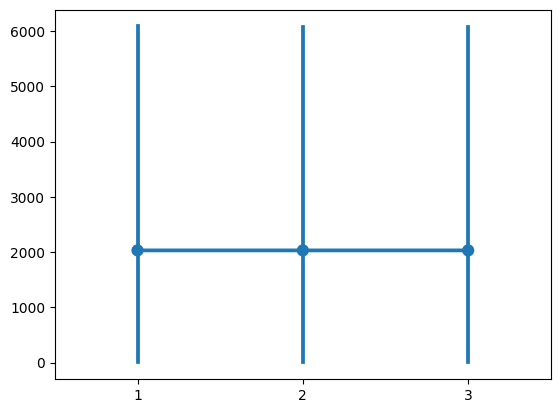

In [94]:
experiments[len(experiments) + 1] = build_nlp_model()

sns.pointplot(pd.DataFrame(experiments))

In [67]:
def build_embeddings_model(average_over_positions=False,
                           vocab_size=1000,
                           sequence_length=20,
                           embedding_dim=2):
  """Build a tf.keras model using embeddings."""
  # Clear session and remove randomness.
  tf.keras.backend.clear_session()
  tf.random.set_seed(0)

  model = tf.keras.Sequential()
  model.add(
    tf.keras.layers.Embedding(
      input_dim=vocab_size,
      output_dim=embedding_dim,
      input_length=sequence_length)
  )

  if average_over_positions:
    # This layer averages over the first dimension of the input by default.
    model.add(tf.keras.layers.GlobalAveragePooling1D())
  else:
    # Concatenate.
    model.add(tf.keras.layers.Flatten())
  model.add(tf.keras.layers.Dense(
      units=1,                     # output dim (for binary classification)
      activation='sigmoid'         # apply the sigmoid function!
  ))

  model.compile(loss='binary_crossentropy', 
                optimizer='adam',
                metrics=['accuracy'])

  return model

In [68]:
model = build_embeddings_model(average_over_positions=True,
                               vocab_size=1000,
                               sequence_length=20,
                               embedding_dim=2)
history = model.fit(
  x = train_data,  # our sparse padded training data
  y = valid_data,          # corresponding binary labels
  epochs=5,             # number of passes through the training data
  batch_size=64,        # mini-batch size
  validation_split=0.1, # use a fraction of the examples for validation
  verbose=1             # display some progress output during training
  )
  
history = pd.DataFrame(history.history)
history
# plot_history(history)

ValueError: `validation_split` is only supported for Tensors or NumPy arrays, found following types in the input: [<class 'tensorflow.python.data.ops.dataset_ops.PaddedBatchDataset'>, <class 'tensorflow.python.data.ops.dataset_ops.PaddedBatchDataset'>]

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=2f4f67ec-8ee7-457f-9dd1-c26bc82a923b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>